отбор методом рулетки или турнирный (чем отличаются)  
рекомбинация (размножение): пробуем 2 способа - дискретная и промежуточная

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
import copy

In [2]:
population_size = 100
mutation_rate = 1.0
number_of_generations = 1000
tournament_size = 50
elite_size = 20

In [3]:
def rosenbrok(x):
    return (1 - x[0])**2 + 100*(x[1] - x[0]**2)**2

In [4]:
def fitness(x):
    return 1 / (rosenbrok(x) + 1)

In [5]:
def generate_population():
    population = []
    r = 100.0
    for i in range(population_size):
        population.append([random.uniform(-r, r), random.uniform(-r, r)])

    return population

In [6]:
def tournament_selection(population, tournament_size):
    tournament = random.sample(population, tournament_size)
    fitness_scores = [fitness(x) for x in tournament]
    winner_index = np.argmax(fitness_scores)
    return tournament[winner_index]


def roulette_wheel_selection(population):
    fitness_scores = [fitness(x) for x in population]
    total_fitness = sum(fitness_scores)
    probabilities = [score / total_fitness for score in fitness_scores]
    cumulative_probabilities = np.cumsum(probabilities)
    random_number = np.random.rand()
    selected_index = np.searchsorted(cumulative_probabilities, random_number)
    return population[selected_index]

In [7]:
def discrete_crossover(parent1, parent2):
    if random.random() < 0.5:
        return [parent1[0], parent2[1]]
    else:
        return [parent2[0], parent1[1]]
    

def intermediate_crossover(parent1, parent2):
    child = []
    d = random.uniform(0.25, 0.3)

    for i in range(len(parent1)):
        alpha = random.uniform(-d, 1 + d)
        child.append(parent1[i] + alpha * (parent2[i] - parent1[i]))

    return child

In [8]:
def mutation(x):
    r = 5
    return [x[0] + random.uniform(-r, r), x[1] + random.uniform(-r, r)]


In [9]:
def draw_plot(history, marker):
    if marker == 2:
        for population in history:
            xs = [point[0] for point in population]
            ys = [point[1] for point in population]
            fig, ax = plt.subplots()
            ax.scatter(xs, ys, s=0.5)
            ax.set_xlim([-100, 100])
            ax.set_ylim([-100, 100])
            plt.show()
    if marker == 3:        
        for population in history:
            xs = [point[0] for point in population]
            ys = [point[1] for point in population]
            zs = [rosenbrok(point) for point in population]
            fig = plt.figure()
            ax = fig.add_subplot(projection='3d')
            ax.scatter(xs, ys, zs, s=2)
            ax.set_xlim([-100, 100])
            ax.set_ylim([-100, 100])
            plt.show()

In [10]:
def genetic_algorithm(crossover_method, is_mut, selection_method, population):
    population = copy.deepcopy(population)
    history = [population]

    for i in range(number_of_generations):
        population.sort(key=fitness, reverse=True)

        best_individual = population[0]
        
        # сохраняем выборку особей с лучшей приспособленностью
        next_generation = copy.deepcopy(population[:elite_size])

        while len(next_generation) < population_size:
            if selection_method == "t":
                parent1 = tournament_selection(population, tournament_size)
                parent2 = tournament_selection(population, tournament_size)
            else:
                parent1 = roulette_wheel_selection(population)
                parent2 = roulette_wheel_selection(population)
            
            child = []

            if crossover_method == "d":
                child = discrete_crossover(parent1, parent2)
            else:
                child = intermediate_crossover(parent1, parent2)
            
            if is_mut:
                x = mutation(child)
            else:
                x = child
                
            next_generation.append(x)

        population = copy.deepcopy(next_generation)

        if i % 50 == 0:
            history.append(population)
            
        if i == 0 or (i + 1) % 50 == 0:
            print(f'Generation {i+1}/{number_of_generations}, Best Fitness: {fitness(best_individual):.6f}')

    population.sort(key=fitness, reverse=True)
    draw_plot(history, marker=3)
    return population[0]

In [11]:
population = generate_population()

отбор турниром

Generation 1/1000, Best Fitness: 0.000263
Generation 50/1000, Best Fitness: 0.011733
Generation 100/1000, Best Fitness: 0.013420
Generation 150/1000, Best Fitness: 0.013420
Generation 200/1000, Best Fitness: 0.017778
Generation 250/1000, Best Fitness: 0.030381
Generation 300/1000, Best Fitness: 0.703862
Generation 350/1000, Best Fitness: 0.929190
Generation 400/1000, Best Fitness: 0.947194
Generation 450/1000, Best Fitness: 0.947194
Generation 500/1000, Best Fitness: 0.999788
Generation 550/1000, Best Fitness: 0.999788
Generation 600/1000, Best Fitness: 0.999788
Generation 650/1000, Best Fitness: 0.999788
Generation 700/1000, Best Fitness: 0.999788
Generation 750/1000, Best Fitness: 0.999788
Generation 800/1000, Best Fitness: 0.999788
Generation 850/1000, Best Fitness: 0.999788
Generation 900/1000, Best Fitness: 0.999788
Generation 950/1000, Best Fitness: 0.999788
Generation 1000/1000, Best Fitness: 0.999788


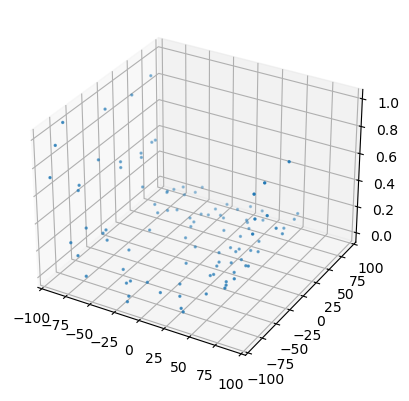

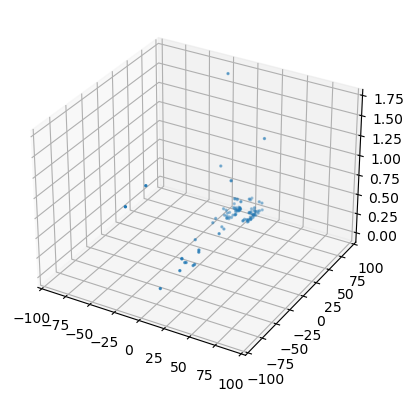

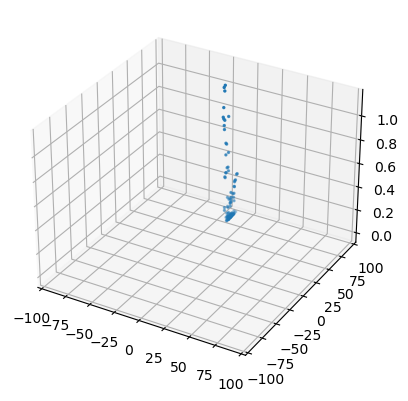

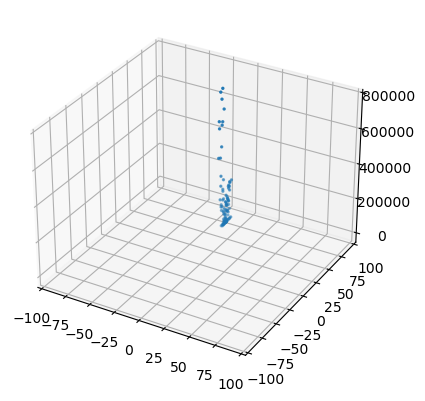

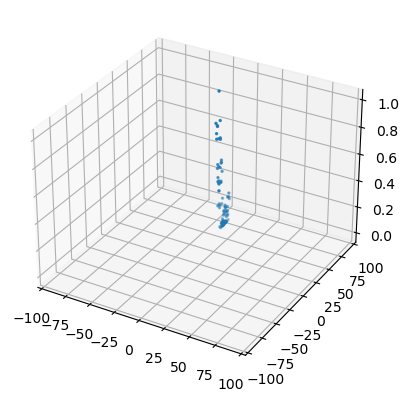

...

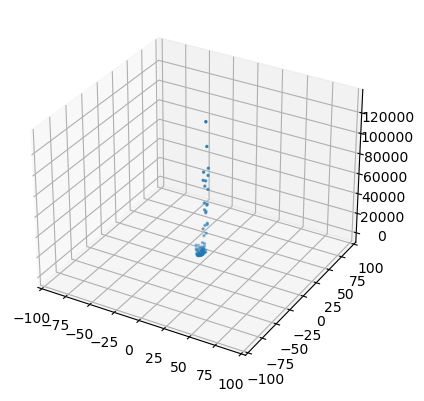

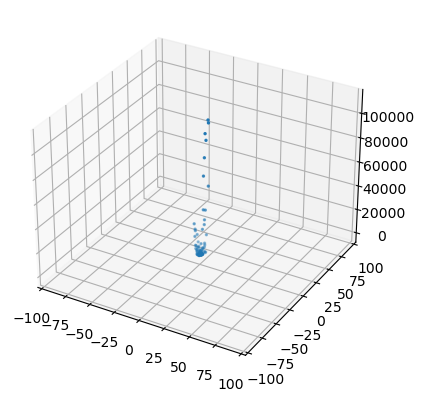

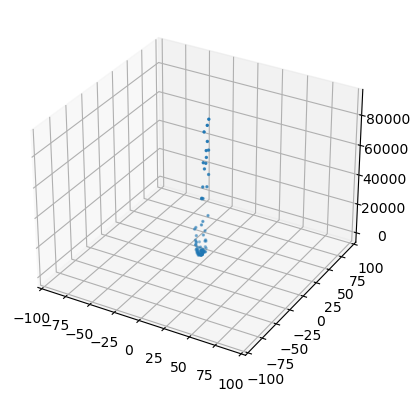

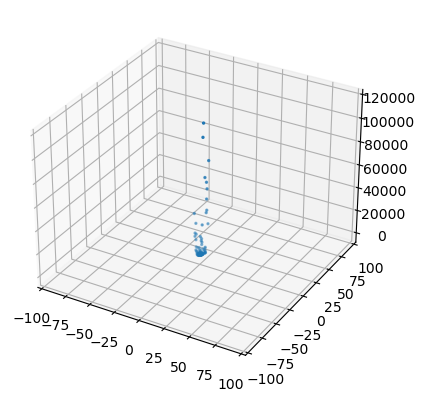

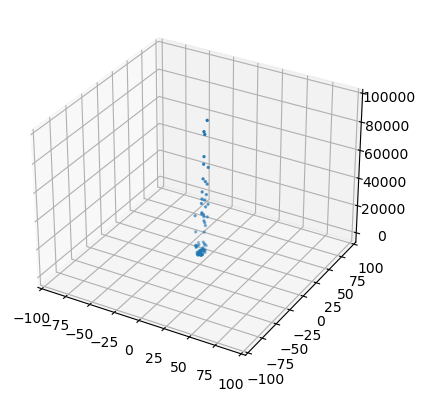

Дискретная рекомбинация:  [1.00638929310779, 1.014128546420555]


In [12]:
res1 = genetic_algorithm("d", True, "t", population)
print("Дискретная рекомбинация: ", res1)

Generation 1/1000, Best Fitness: 0.000263
Generation 50/1000, Best Fitness: 0.010377
Generation 100/1000, Best Fitness: 0.011121
Generation 150/1000, Best Fitness: 0.012777
Generation 200/1000, Best Fitness: 0.015446
Generation 250/1000, Best Fitness: 0.017236
Generation 300/1000, Best Fitness: 0.035754
Generation 350/1000, Best Fitness: 0.946598
Generation 400/1000, Best Fitness: 0.946598
Generation 450/1000, Best Fitness: 0.946598
Generation 500/1000, Best Fitness: 0.978919
Generation 550/1000, Best Fitness: 0.994420
Generation 600/1000, Best Fitness: 0.994420
Generation 650/1000, Best Fitness: 0.994420
Generation 700/1000, Best Fitness: 0.994420
Generation 750/1000, Best Fitness: 0.994420
Generation 800/1000, Best Fitness: 0.994420
Generation 850/1000, Best Fitness: 0.994420
Generation 900/1000, Best Fitness: 0.994420
Generation 950/1000, Best Fitness: 0.994420
Generation 1000/1000, Best Fitness: 0.994420


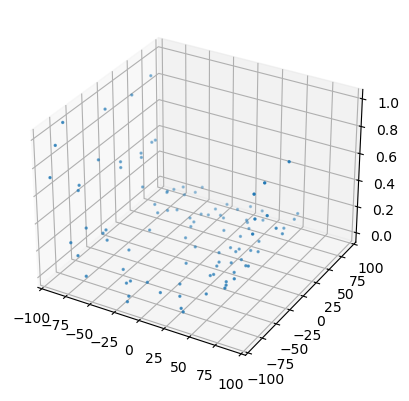

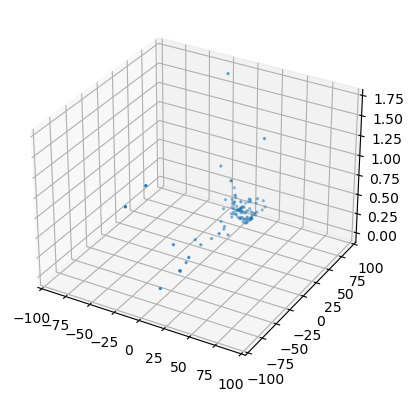

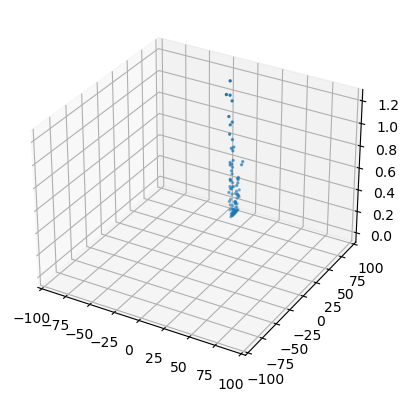

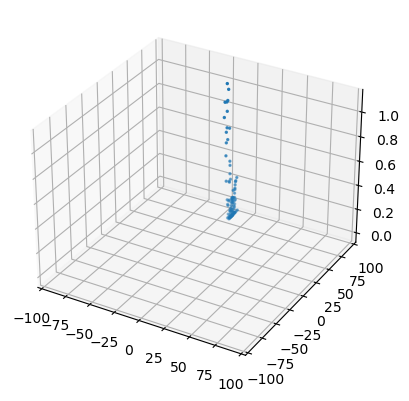

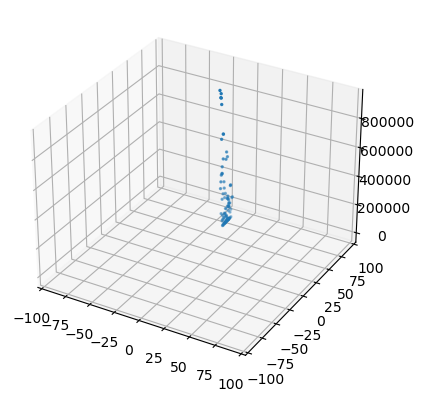

...

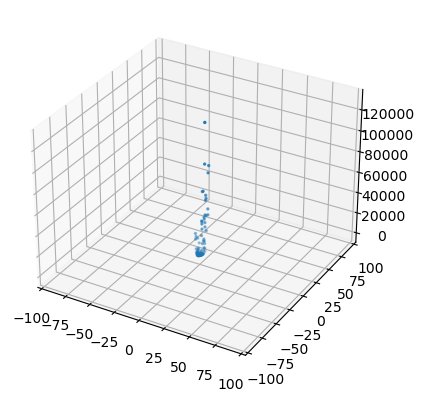

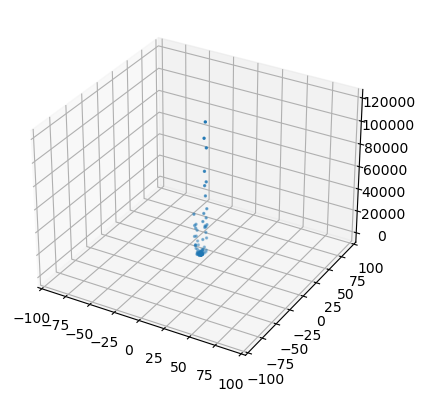

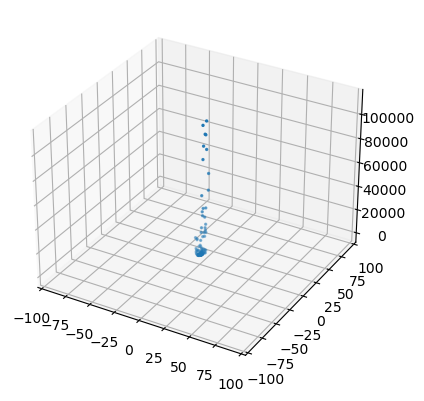

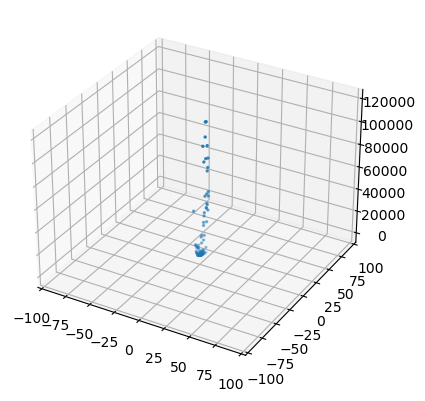

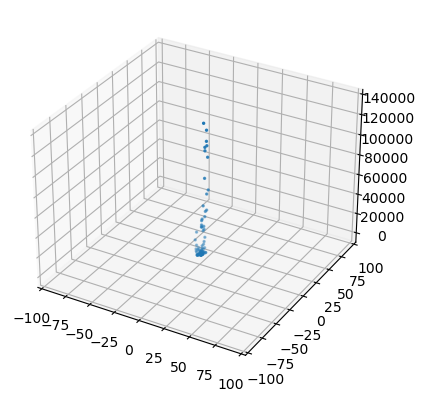

Промежуточная рекомбинация:  [1.0719722589825098, 1.1470470811971842]


In [13]:
res2 = genetic_algorithm("i", True, "t", population)
print("Промежуточная рекомбинация: ", res2)

метод отбора рулеткой

Generation 1/1000, Best Fitness: 0.000263
Generation 50/1000, Best Fitness: 0.009252
Generation 100/1000, Best Fitness: 0.009601
Generation 150/1000, Best Fitness: 0.009887
Generation 200/1000, Best Fitness: 0.009887
Generation 250/1000, Best Fitness: 0.010382
Generation 300/1000, Best Fitness: 0.010662
Generation 350/1000, Best Fitness: 0.011196
Generation 400/1000, Best Fitness: 0.012197
Generation 450/1000, Best Fitness: 0.012927
Generation 500/1000, Best Fitness: 0.015306
Generation 550/1000, Best Fitness: 0.015306
Generation 600/1000, Best Fitness: 0.016522
Generation 650/1000, Best Fitness: 0.016522
Generation 700/1000, Best Fitness: 0.017949
Generation 750/1000, Best Fitness: 0.017949
Generation 800/1000, Best Fitness: 0.018606
Generation 850/1000, Best Fitness: 0.021360
Generation 900/1000, Best Fitness: 0.024022
Generation 950/1000, Best Fitness: 0.028881
Generation 1000/1000, Best Fitness: 0.030227


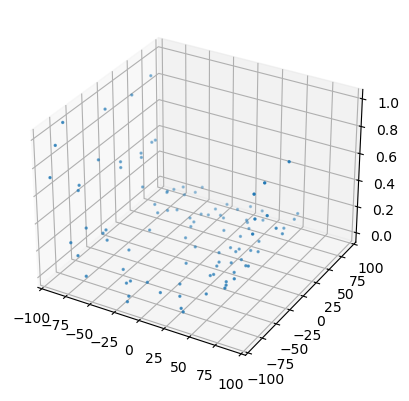

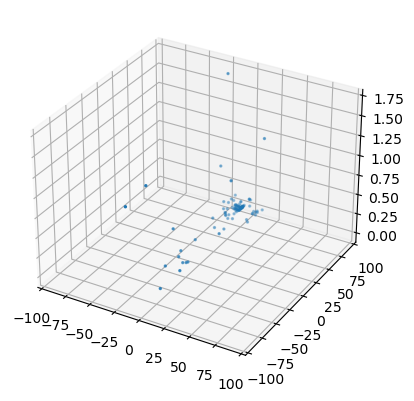

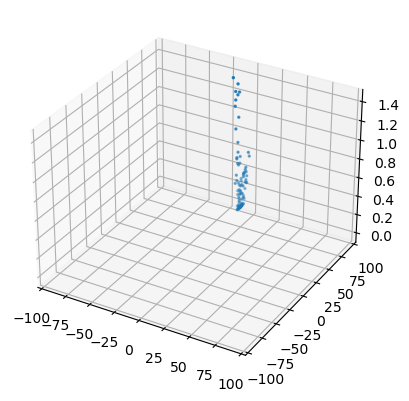

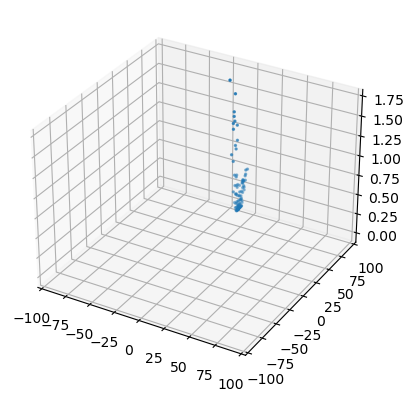

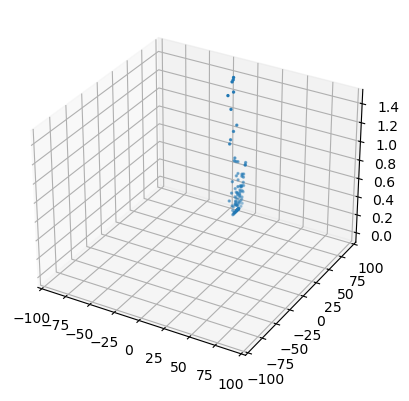

...

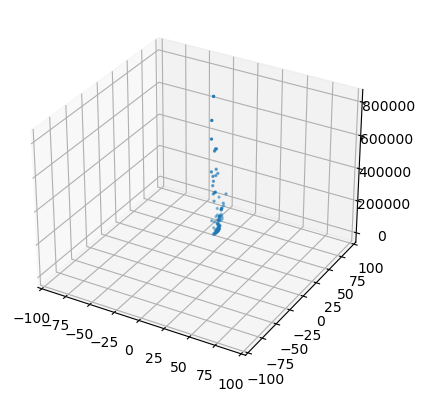

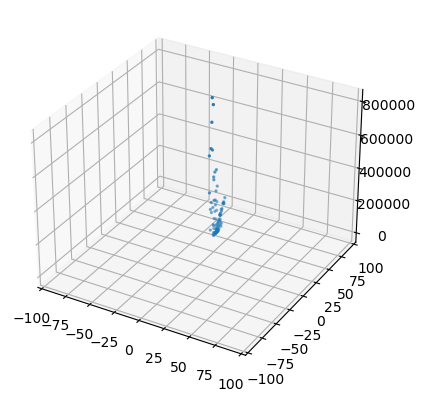

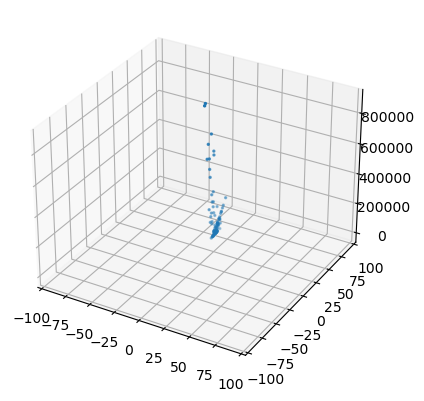

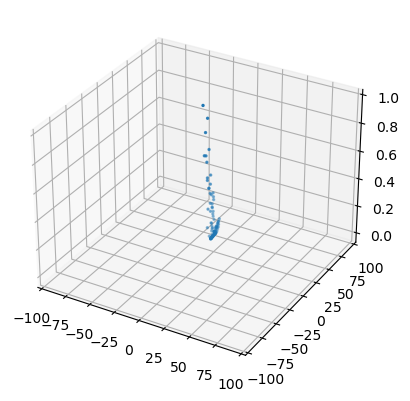

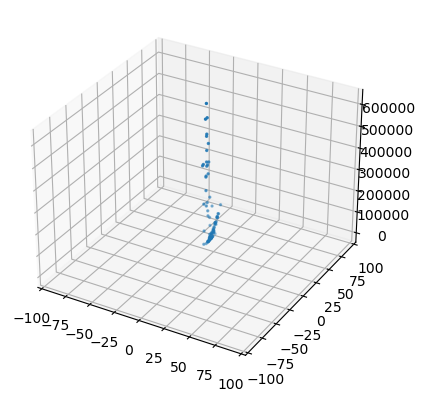

Дискретная рекомбинация:  [-4.5679291334771275, 20.762009848646407]


In [14]:
res1 = genetic_algorithm("d", True, "r", population)
print("Дискретная рекомбинация: ", res1)

Generation 1/1000, Best Fitness: 0.000263
Generation 50/1000, Best Fitness: 0.019695
Generation 100/1000, Best Fitness: 0.020210
Generation 150/1000, Best Fitness: 0.020210
Generation 200/1000, Best Fitness: 0.023247
Generation 250/1000, Best Fitness: 0.028139
Generation 300/1000, Best Fitness: 0.039919
Generation 350/1000, Best Fitness: 0.039919
Generation 400/1000, Best Fitness: 0.039919
Generation 450/1000, Best Fitness: 0.041773
Generation 500/1000, Best Fitness: 0.050942
Generation 550/1000, Best Fitness: 0.063745
Generation 600/1000, Best Fitness: 0.063745
Generation 650/1000, Best Fitness: 0.092889
Generation 700/1000, Best Fitness: 0.098633
Generation 750/1000, Best Fitness: 0.180725
Generation 800/1000, Best Fitness: 0.972704
Generation 850/1000, Best Fitness: 0.982071
Generation 900/1000, Best Fitness: 0.982071
Generation 950/1000, Best Fitness: 0.982071
Generation 1000/1000, Best Fitness: 0.982071


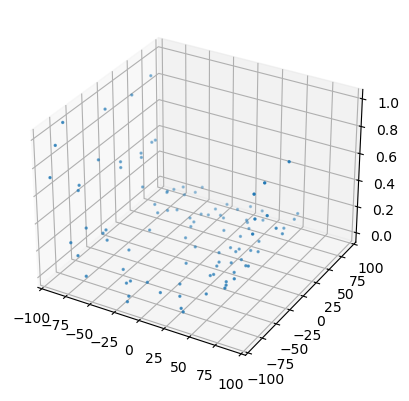

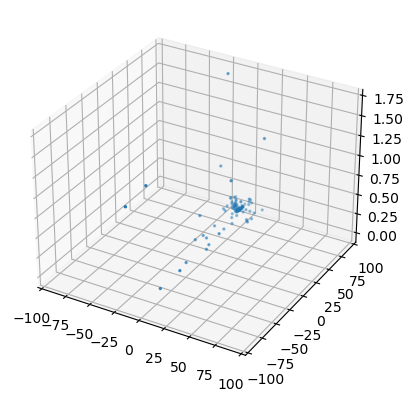

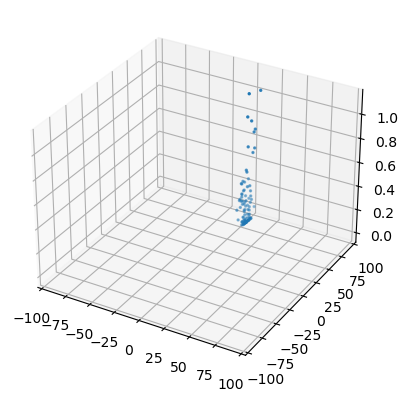

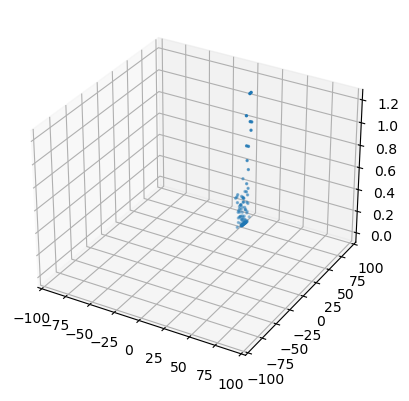

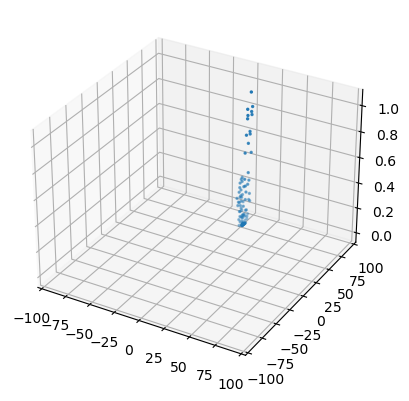

...

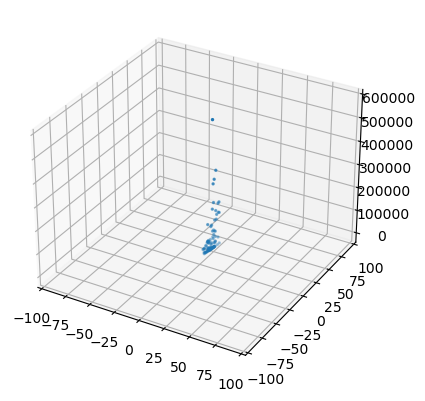

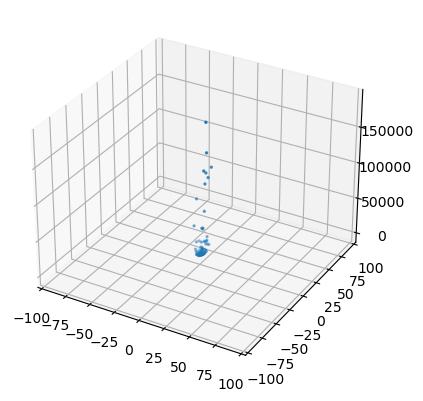

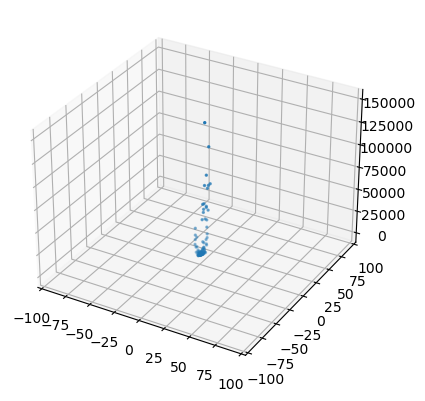

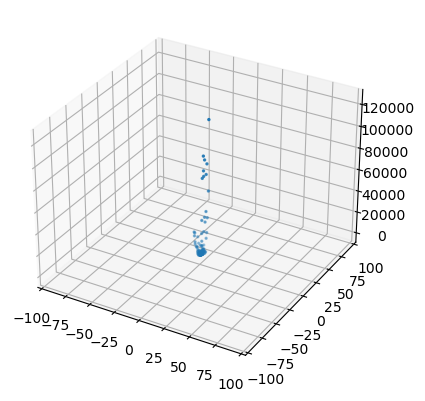

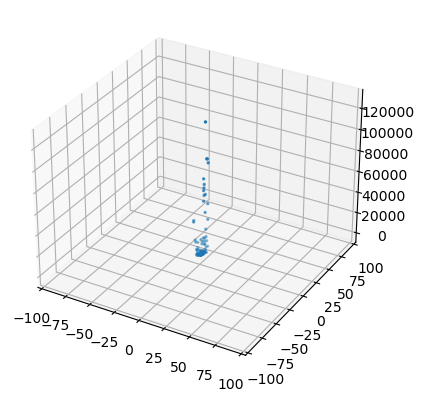

Промежуточная рекомбинация:  [1.0714667128703632, 1.1595075824122578]


In [15]:
res2 = genetic_algorithm("i", True, "r", population)
print("Промежуточная рекомбинация: ", res2)

## проверяем без учета мутации

Generation 1/1000, Best Fitness: 0.000263
Generation 50/1000, Best Fitness: 0.005315
Generation 100/1000, Best Fitness: 0.005315
Generation 150/1000, Best Fitness: 0.005315
Generation 200/1000, Best Fitness: 0.005315
Generation 250/1000, Best Fitness: 0.005315
Generation 300/1000, Best Fitness: 0.005315
Generation 350/1000, Best Fitness: 0.005315
Generation 400/1000, Best Fitness: 0.005315
Generation 450/1000, Best Fitness: 0.005315
Generation 500/1000, Best Fitness: 0.005315
Generation 550/1000, Best Fitness: 0.005315
Generation 600/1000, Best Fitness: 0.005315
Generation 650/1000, Best Fitness: 0.005315
Generation 700/1000, Best Fitness: 0.005315
Generation 750/1000, Best Fitness: 0.005315
Generation 800/1000, Best Fitness: 0.005315
Generation 850/1000, Best Fitness: 0.005315
Generation 900/1000, Best Fitness: 0.005315
Generation 950/1000, Best Fitness: 0.005315
Generation 1000/1000, Best Fitness: 0.005315


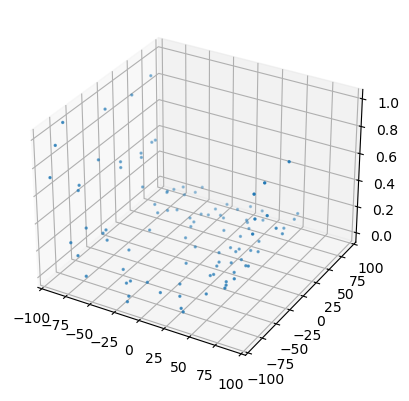

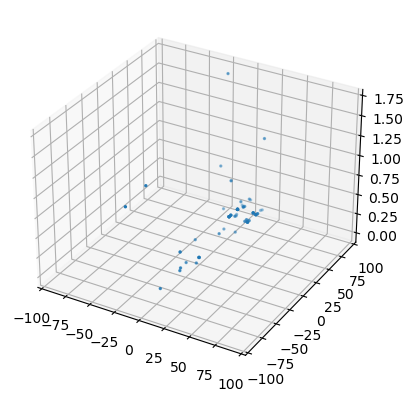

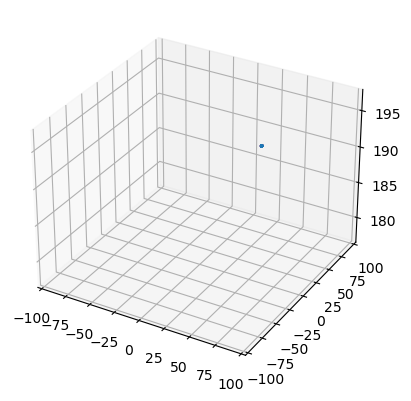

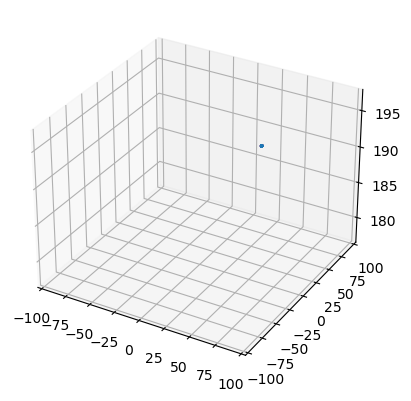

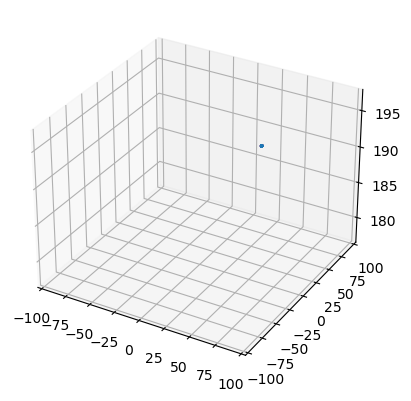

...

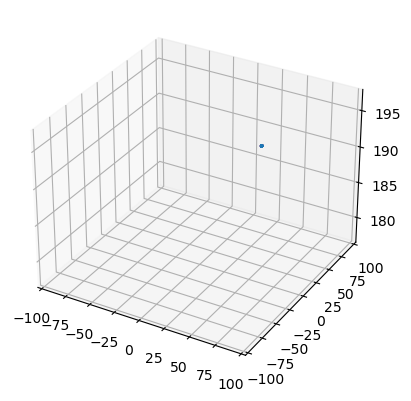

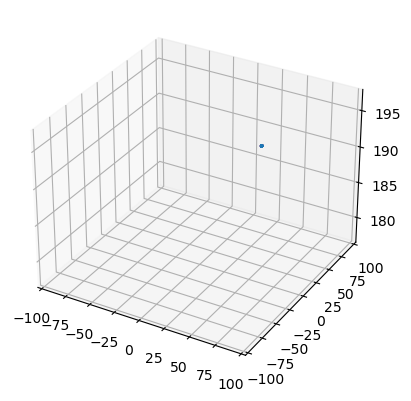

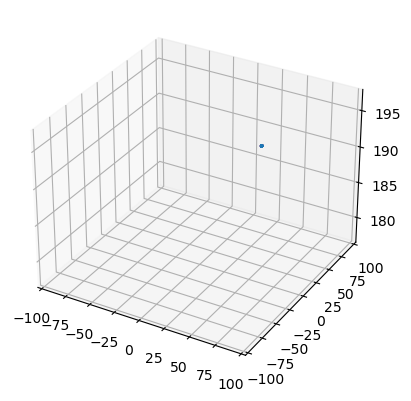

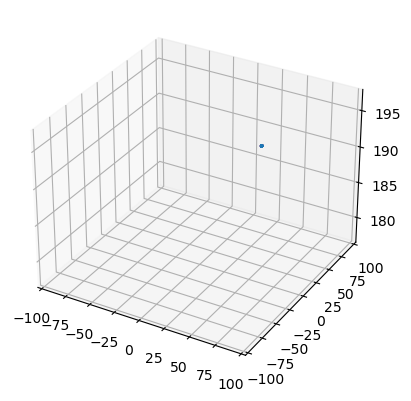

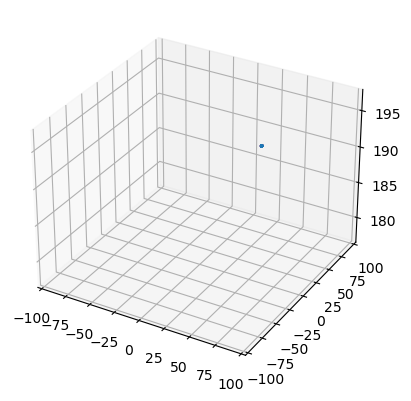

Дискретная рекомбинация:  [9.729434940432057, 95.71517497011911]


In [16]:
res1 = genetic_algorithm("d", False, "t", population)
print("Дискретная рекомбинация: ", res1)

Generation 1/1000, Best Fitness: 0.000263
Generation 50/1000, Best Fitness: 0.009208
Generation 100/1000, Best Fitness: 0.009208
Generation 150/1000, Best Fitness: 0.009208
Generation 200/1000, Best Fitness: 0.009208
Generation 250/1000, Best Fitness: 0.009208
Generation 300/1000, Best Fitness: 0.009208
Generation 350/1000, Best Fitness: 0.009208
Generation 400/1000, Best Fitness: 0.009208
Generation 450/1000, Best Fitness: 0.009208
Generation 500/1000, Best Fitness: 0.009208
Generation 550/1000, Best Fitness: 0.009208
Generation 600/1000, Best Fitness: 0.009208
Generation 650/1000, Best Fitness: 0.009208
Generation 700/1000, Best Fitness: 0.009208
Generation 750/1000, Best Fitness: 0.009208
Generation 800/1000, Best Fitness: 0.009208
Generation 850/1000, Best Fitness: 0.009208
Generation 900/1000, Best Fitness: 0.009208
Generation 950/1000, Best Fitness: 0.009208
Generation 1000/1000, Best Fitness: 0.009208


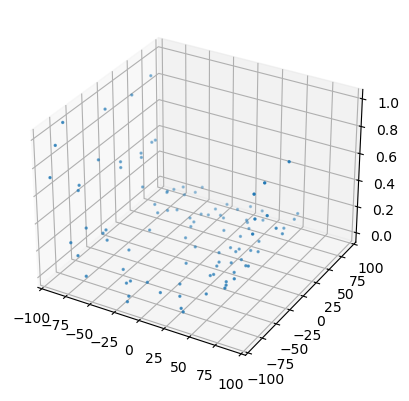

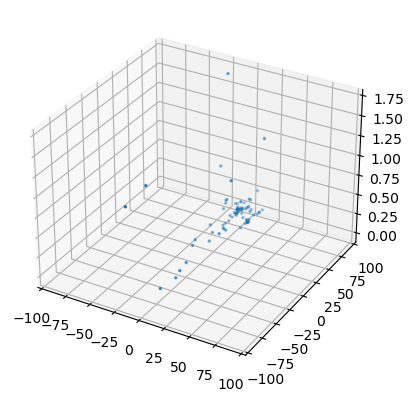

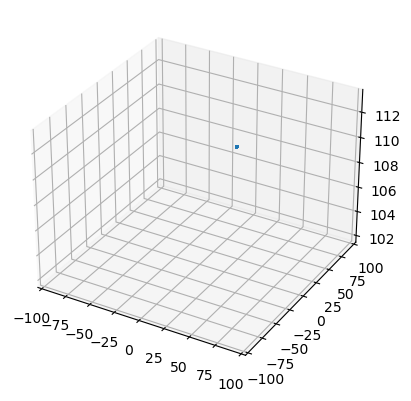

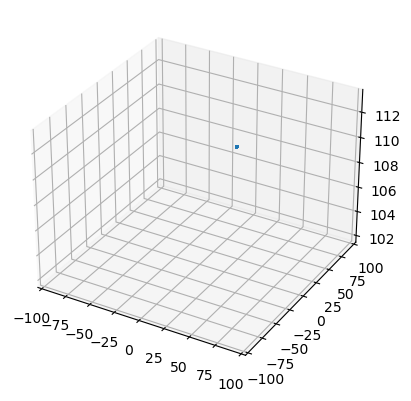

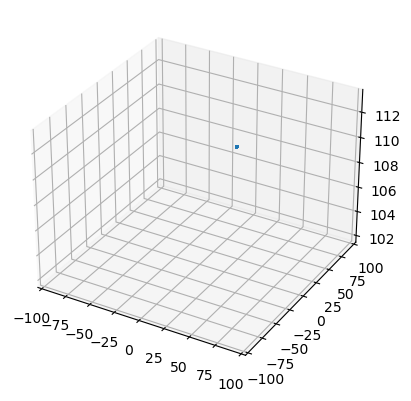

...

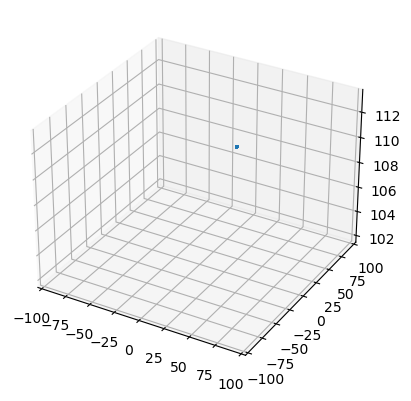

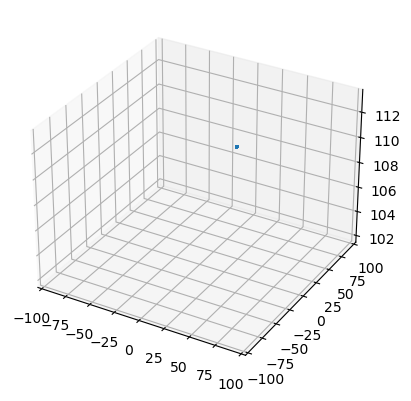

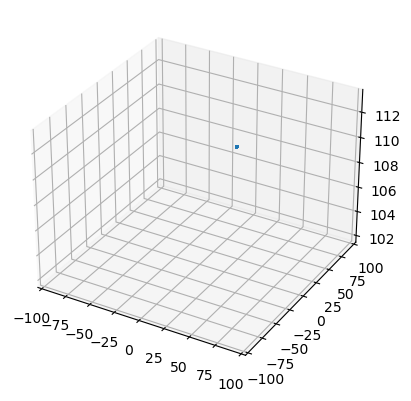

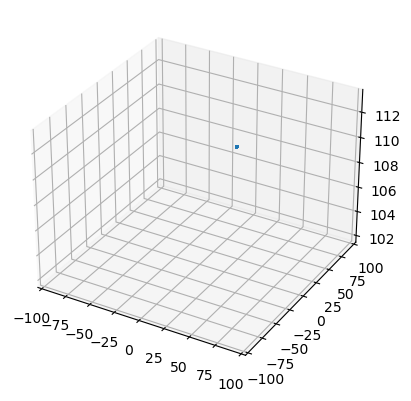

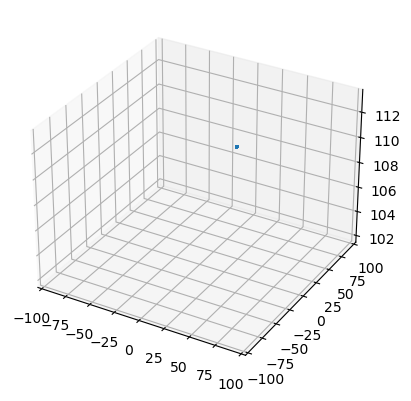

Промежуточная рекомбинация:  [-9.130686916468031, 83.14642757783851]


In [17]:
res2 = genetic_algorithm("i", False, "t", population)
print("Промежуточная рекомбинация: ", res2)